# Lets do the pre processing of the dataset

Visualizing: case12_sub106.edf
Extracting EDF parameters from /Users/pavankonam/Downloads/Dataset for EEG/New Database/EEG-waves/case12_sub106.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 537999  =      0.000 ...   537.999 secs...
Using matplotlib as 2D backend.


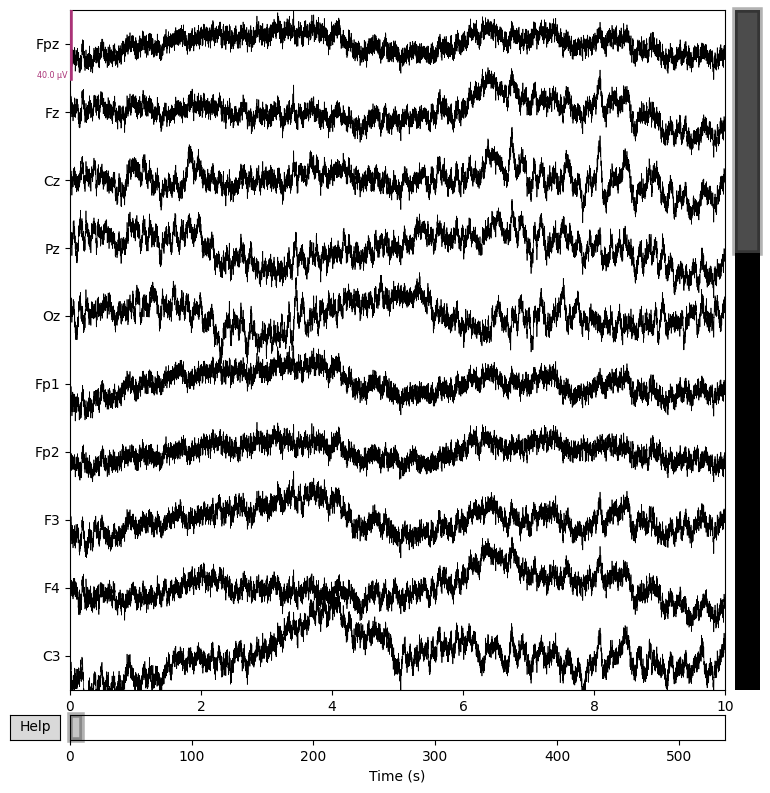

Visualizing: case03_sub102.edf
Extracting EDF parameters from /Users/pavankonam/Downloads/Dataset for EEG/New Database/EEG-waves/case03_sub102.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1050999  =      0.000 ...  1050.999 secs...


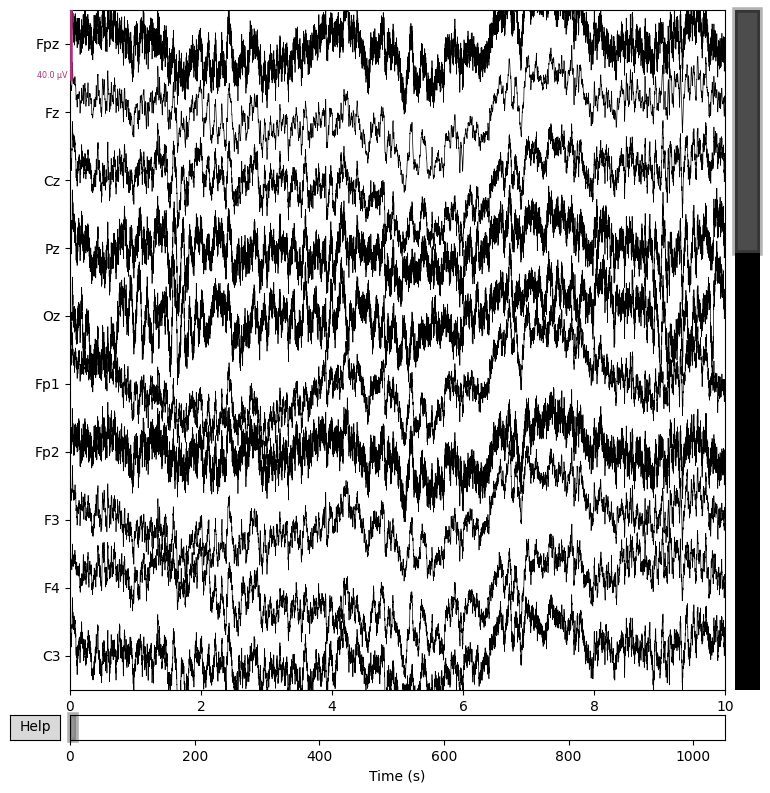

Visualizing: case20_sub111.edf
Extracting EDF parameters from /Users/pavankonam/Downloads/Dataset for EEG/New Database/EEG-waves/case20_sub111.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 125999  =      0.000 ...   125.999 secs...


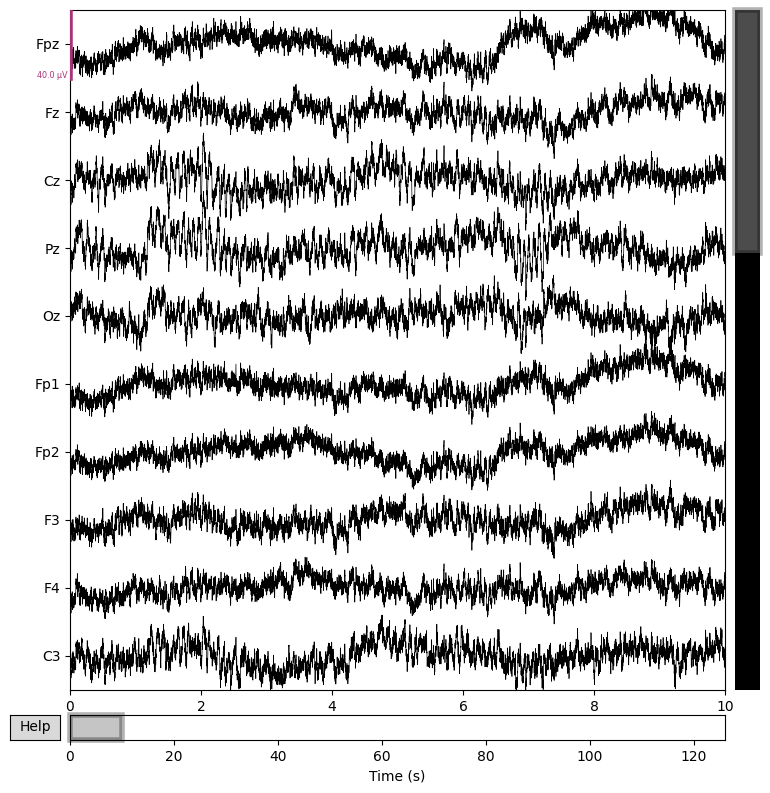

In [2]:
import os
import pandas as pd
import numpy as np
import mne
import matplotlib.pyplot as plt

# Set paths
EDF_FOLDER = "/Users/pavankonam/Downloads/Dataset for EEG/New Database/EEG-waves"  # Change this
CSV_FILE = "/Users/pavankonam/Downloads/Dataset for EEG/modified_file.csv"  # Change this

# Load the CSV file
df = pd.read_csv(CSV_FILE)

# Pick 3 sample files for analysis
sample_files = df["Filename"].tolist()[:3]  # Change number if needed

# Function to plot raw EEG signal
def plot_eeg(file_path):
    raw = mne.io.read_raw_edf(file_path, preload=True)
    raw.plot(duration=10, n_channels=10, title=file_path)
    plt.show()

# Apply function to sample files
for file_name in sample_files:
    file_path = os.path.join(EDF_FOLDER, file_name)
    print(f"Visualizing: {file_name}")
    plot_eeg(file_path)


Extracting EDF parameters from /Users/pavankonam/Downloads/Dataset for EEG/New Database/EEG-waves/01NN_seg01.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 15359  =      0.000 ...    59.996 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 4 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 4.00 Hz
- Upper transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 5.00 Hz)
- Filter length: 1691 samples (6.605 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 4 - 8 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass f

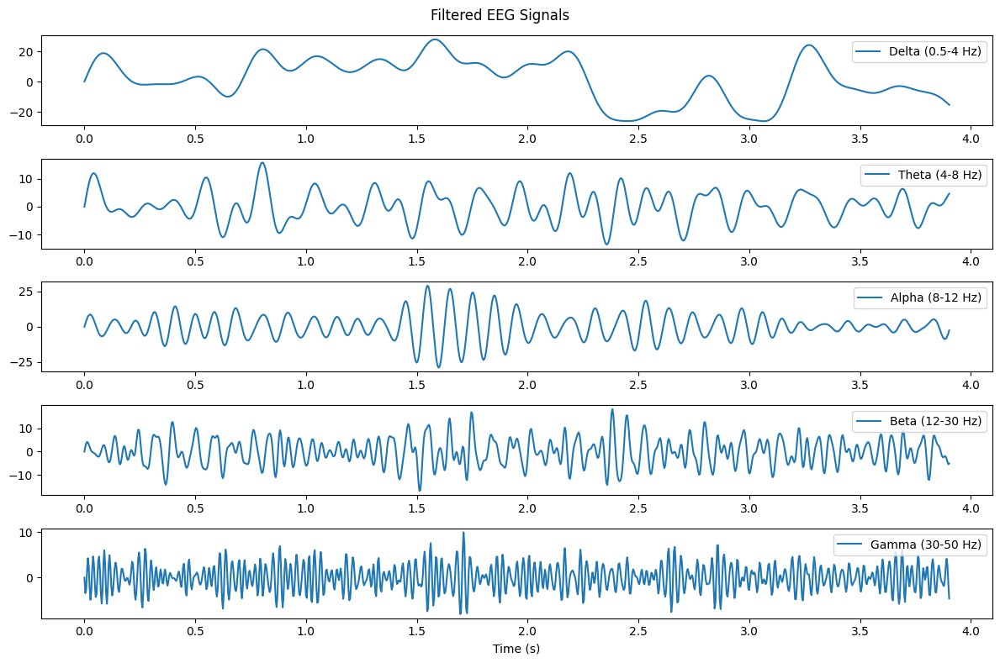

In [3]:
import os
import mne
import numpy as np
import matplotlib.pyplot as plt

# Set path to your EDF file (choose one sample file)
EDF_FILE = "/Users/pavankonam/Downloads/Dataset for EEG/New Database/EEG-waves/01NN_seg01.edf"  # Change this

# Load the EEG data
raw = mne.io.read_raw_edf(EDF_FILE, preload=True)

# Define frequency bands
bands = {
    "Delta (0.5-4 Hz)": (0.5, 4),
    "Theta (4-8 Hz)": (4, 8),
    "Alpha (8-12 Hz)": (8, 12),
    "Beta (12-30 Hz)": (12, 30),
    "Gamma (30-50 Hz)": (30, 50),
}

# Plot original signal
plt.figure(figsize=(12, 8))
plt.suptitle("Filtered EEG Signals")

for i, (band_name, (low, high)) in enumerate(bands.items(), 1):
    filtered_raw = raw.copy().filter(l_freq=low, h_freq=high, fir_design="firwin")
    data, times = filtered_raw[:1, :]

    plt.subplot(len(bands), 1, i)
    plt.plot(times[:1000], data[0, :1000], label=band_name)  # Show first 1000 points
    plt.legend(loc="upper right")

plt.xlabel("Time (s)")
plt.tight_layout()
plt.show()


In [4]:
import mne
import numpy as np
import pandas as pd
from scipy.stats import skew, kurtosis
from scipy.signal import welch

# Define the EEG frequency bands
bands = {
    "Theta": (4, 8),
    "Alpha": (8, 12),
    "Beta": (12, 30)
}

# Load an EEG file (Change the path to match your dataset)
edf_path = "/Users/pavankonam/Downloads/Dataset for EEG/New Database/EEG-waves/01NN_seg01.edf"
raw = mne.io.read_raw_edf(edf_path, preload=True)

# Set EEG montage for proper channel mapping
raw.set_montage("standard_1020", on_missing="ignore")

# Apply bandpass filters and extract features
sfreq = raw.info['sfreq']  # Sampling frequency
channel_names = raw.ch_names
features = []

for ch_idx, ch_name in enumerate(channel_names):
    ch_data = raw.get_data(picks=[ch_idx])

    # Extract features for each band
    for band_name, (low_f, high_f) in bands.items():
        filtered_data = mne.filter.filter_data(ch_data, sfreq, low_f, high_f, verbose=False)

        # Compute Power Spectral Density (PSD)
        freqs, psd = welch(filtered_data, sfreq, nperseg=sfreq*2)
        psd_mean = np.mean(psd)
        psd_std = np.std(psd)

        # Compute statistical features
        mean_val = np.mean(filtered_data)
        var_val = np.var(filtered_data)
        skew_val = skew(filtered_data, axis=1)[0]
        kurt_val = kurtosis(filtered_data, axis=1)[0]

        # Store features
        features.append([ch_name, band_name, psd_mean, psd_std, mean_val, var_val, skew_val, kurt_val])

# Convert to a DataFrame
df_features = pd.DataFrame(features, columns=["Channel", "Band", "PSD_Mean", "PSD_Std", "Mean", "Variance", "Skewness", "Kurtosis"])

# Save to CSV
df_features.to_csv("EEG_Features.csv", index=False)
print("Feature extraction complete. Features saved to 'EEG_Features.csv'.")


Extracting EDF parameters from /Users/pavankonam/Downloads/Dataset for EEG/New Database/EEG-waves/01NN_seg01.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 15359  =      0.000 ...    59.996 secs...
Feature extraction complete. Features saved to 'EEG_Features.csv'.


Since now we are able to extract the features from one file. Lets make a list of all the files and later combine both the dataset so that it is easy for mapping.

In [7]:
import os
import mne
import numpy as np
import pandas as pd

# Path to folder containing EDF files
edf_folder = "/Users/pavankonam/Downloads/Dataset for EEG/New Database/EEG-waves"  # <-- Change this to your actual path
output_csv = "EEG_Features.csv"

# Define frequency bands (Hz)
bands = {
    "Delta": (0.5, 4),
    "Theta": (4, 8),
    "Alpha": (8, 13),
    "Beta": (13, 30),
    "Gamma": (30, 45)
}

# Function to compute Power Spectral Density (PSD)
def compute_features(edf_path):
    try:
        raw = mne.io.read_raw_edf(edf_path, preload=True, infer_types=True, exclude=['EDF Annotations'])
        raw.filter(0.5, 45, method='iir')  # Bandpass filter to remove noise

        features = []
        for ch_name in raw.ch_names:
            data, _ = raw[ch_name, :]
            
            for band, (low, high) in bands.items():
                psd, freqs = mne.time_frequency.psd_array_multitaper(data, raw.info['sfreq'], fmin=low, fmax=high)
                psd_mean = np.mean(psd)
                psd_std = np.std(psd)
                mean = np.mean(data)
                variance = np.var(data)
                skewness = np.mean(((data - mean) / np.sqrt(variance))**3)
                kurtosis = np.mean(((data - mean) / np.sqrt(variance))**4)

                features.append([os.path.basename(edf_path), ch_name, band, psd_mean, psd_std, mean, variance, skewness, kurtosis])
        
        return features
    
    except Exception as e:
        print(f"Skipping {edf_path} due to error: {e}")
        return []

# Process all EDF files
all_features = []
for edf_file in os.listdir(edf_folder):
    if edf_file.endswith(".edf"):
        edf_path = os.path.join(edf_folder, edf_file)
        print(f"Processing {edf_file}...")
        all_features.extend(compute_features(edf_path))

# Save to CSV
df = pd.DataFrame(all_features, columns=["Filename", "Channel", "Band", "PSD_Mean", "PSD_Std", "Mean", "Variance", "Skewness", "Kurtosis"])
df.to_csv(output_csv, index=False)
print(f"Feature extraction complete! Saved to {output_csv}")


Processing 73MT_seg04.edf...
Extracting EDF parameters from /Users/pavankonam/Downloads/Dataset for EEG/New Database/EEG-waves/73MT_seg04.edf...
EDF file detected
Channel 'EOG G' recognized as type EOG (renamed to 'G').
Channel 'EOG D' recognized as type EOG (renamed to 'D').
Channel 'EMG 1-EMG 2' recognized as type EMG (renamed to '1-EMG 2').
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 15359  =      0.000 ...    59.996 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 45 Hz

IIR filter parameters
---------------------
Butterworth bandpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 16 (effective, after forward-backward)
- Cutoffs at 0.50, 45.00 Hz: -6.02, -6.02 dB

    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estim

/var/folders/60/m4vjsxs154b8jqhld_x5c2j80000gn/T/ipykernel_44553/1293346749.py:22: RuntimeWarning: Scaling factor is not defined in following channels:
POx-Red, POx-InfraRed
  raw = mne.io.read_raw_edf(edf_path, preload=True, infer_types=True, exclude=['EDF Annotations'])
/var/folders/60/m4vjsxs154b8jqhld_x5c2j80000gn/T/ipykernel_44553/1293346749.py:22: RuntimeWarning: Physical range is not defined in following channels:
POx-Red, POx-InfraRed
  raw = mne.io.read_raw_edf(edf_path, preload=True, infer_types=True, exclude=['EDF Annotations'])


    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spe

/var/folders/60/m4vjsxs154b8jqhld_x5c2j80000gn/T/ipykernel_44553/1293346749.py:35: RuntimeWarning: invalid value encountered in divide
  skewness = np.mean(((data - mean) / np.sqrt(variance))**3)
/var/folders/60/m4vjsxs154b8jqhld_x5c2j80000gn/T/ipykernel_44553/1293346749.py:36: RuntimeWarning: invalid value encountered in divide
  kurtosis = np.mean(((data - mean) / np.sqrt(variance))**4)


    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
Processing DL030_night07.edf...
Extracting EDF parameters from /Users/pavankonam/Downloads/Dataset for EEG/New Database/EEG-waves/DL030_night07.edf...
EDF file detected
Channel 'EEG Fp1-O1' recognized as type EEG (renamed to 'Fp1-O1').
Channel 'EEG Fp1-O2' recognized as type EEG (renamed to 'Fp1-O2').
Channel 'EEG Fp1-F7' recognized as type EEG (renamed to 'Fp1-F7').
Channel 'EEG F8-F7' recognized as type EEG (renamed to 'F8-F7').
Channel 'EEG F7-O1' recognized as type EEG (renamed to 'F7-O1').
Channel 'EEG F8-O2' recognized as type EEG (renamed to 'F8-O2').
Channel 

In [8]:
import pandas as pd

# Load the EEG Features dataset
eeg_features_path = "/Users/pavankonam/Downloads/Dataset for EEG/EEG_Features.csv"
eeg_features = pd.read_csv(eeg_features_path)

# Load the dream category dataset
dream_categories_path = "/Users/pavankonam/Downloads/Dataset for EEG/modified_file.csv"
dream_categories = pd.read_csv(dream_categories_path)

# Ensure filenames are in the same format (strip spaces, lowercase, etc.)
eeg_features["Filename"] = eeg_features.iloc[:, 0].str.strip().str.lower()  # First column contains filename
dream_categories["Filename"] = dream_categories["Filename"].str.strip().str.lower()

# Merge datasets on the filename
merged_df = eeg_features.merge(dream_categories, on="Filename", how="inner")

# Drop unnecessary columns (if any)
merged_df = merged_df.drop(columns=["Unnamed: 0"], errors="ignore")  # Some CSVs have an unnamed index column

# Save the merged dataset
merged_df.to_csv("Merged_EEG_Dreams.csv", index=False)

print("Merging complete! The merged dataset is saved as 'Merged_EEG_Dreams.csv'.")


Merging complete! The merged dataset is saved as 'Merged_EEG_Dreams.csv'.


In [9]:
import pandas as pd
import re
from sklearn.model_selection import train_test_split

# Load the dataset
file_path = "/Users/pavankonam/Downloads/Dataset for EEG/Merged_EEG_Dreams.csv"
df = pd.read_csv(file_path)

# Step 1: Extract Subject ID from Filenames
df["Subject_ID"] = df["Filename"].apply(lambda x: re.match(r"([A-Za-z0-9]+)_", x).group(1) if re.match(r"([A-Za-z0-9]+)_", x) else x)

# Step 2: Convert categories to text and numerical features to float
categorical_columns = ["Category"]  # Adjust if there are other categorical columns
numerical_columns = [col for col in df.columns if col not in ["Filename", "Subject_ID", "Category"]]

df[categorical_columns] = df[categorical_columns].astype(str)
df[numerical_columns] = df[numerical_columns].apply(pd.to_numeric, errors="coerce")

# Step 3: Handle missing values (Fill NaN with column mean for numerical values)
df[numerical_columns] = df[numerical_columns].fillna(df[numerical_columns].mean())

# Step 4: Split Data by Subject_ID (80% Train, 10% Validation, 10% Test)
unique_subjects = df["Subject_ID"].unique()
train_subjects, test_subjects = train_test_split(unique_subjects, test_size=0.2, random_state=42)
val_subjects, test_subjects = train_test_split(test_subjects, test_size=0.5, random_state=42)

train_df = df[df["Subject_ID"].isin(train_subjects)]
val_df = df[df["Subject_ID"].isin(val_subjects)]
test_df = df[df["Subject_ID"].isin(test_subjects)]

# Step 5: Save Processed Datasets
train_df.to_csv("Train_EEG_Dreams.csv", index=False)
val_df.to_csv("Val_EEG_Dreams.csv", index=False)
test_df.to_csv("Test_EEG_Dreams.csv", index=False)

print("✅ Data Cleaning & Splitting Complete!")
print(f"Training Set: {train_df.shape}")
print(f"Validation Set: {val_df.shape}")
print(f"Test Set: {test_df.shape}")


✅ Data Cleaning & Splitting Complete!
Training Set: (86260, 11)
Validation Set: (23485, 11)
Test Set: (9035, 11)


In [12]:
import pandas as pd
from sklearn.preprocessing import StandardScaler, LabelEncoder
import numpy as np

# Load cleaned datasets
train_df = pd.read_csv("/Users/pavankonam/Downloads/Dataset for EEG/Train_EEG_Dreams.csv")
val_df = pd.read_csv("/Users/pavankonam/Downloads/Dataset for EEG/Val_EEG_Dreams.csv")
test_df = pd.read_csv("/Users/pavankonam/Downloads/Dataset for EEG/Test_EEG_Dreams.csv")

# Identify numerical and categorical columns
non_numeric_cols = ["Filename", "Category"]
numerical_columns = train_df.select_dtypes(include=['float64', 'int64']).columns.tolist()

# Ensure we don't include non-numeric columns in scaling
numerical_columns = [col for col in numerical_columns if col not in non_numeric_cols]

# Handle NaN or Infinite values
for df in [train_df, val_df, test_df]:
    df[numerical_columns] = df[numerical_columns].replace([np.inf, -np.inf], np.nan)  # Replace infinities with NaN
    df[numerical_columns] = df[numerical_columns].fillna(df[numerical_columns].mean())  # Fill NaN with column mean

# Scale numerical features
scaler = StandardScaler()
train_df[numerical_columns] = scaler.fit_transform(train_df[numerical_columns])
val_df[numerical_columns] = scaler.transform(val_df[numerical_columns])
test_df[numerical_columns] = scaler.transform(test_df[numerical_columns])

# Encode categorical labels
encoder = LabelEncoder()
train_df["Category"] = encoder.fit_transform(train_df["Category"])
val_df["Category"] = encoder.transform(val_df["Category"])
test_df["Category"] = encoder.transform(test_df["Category"])

# Save processed data
train_df.to_csv("Processed_Train_EEG_Dreams.csv", index=False)
val_df.to_csv("Processed_Val_EEG_Dreams.csv", index=False)
test_df.to_csv("Processed_Test_EEG_Dreams.csv", index=False)

print("✅ Feature Scaling & Encoding Complete! NaN & Infinite Values Handled.")


/Users/pavankonam/miniconda3/envs/ai-engineering-bootcamp/lib/python3.10/site-packages/sklearn/utils/extmath.py:1101: RuntimeWarning: invalid value encountered in divide
  updated_mean = (last_sum + new_sum) / updated_sample_count
/Users/pavankonam/miniconda3/envs/ai-engineering-bootcamp/lib/python3.10/site-packages/sklearn/utils/extmath.py:1106: RuntimeWarning: invalid value encountered in divide
  T = new_sum / new_sample_count
/Users/pavankonam/miniconda3/envs/ai-engineering-bootcamp/lib/python3.10/site-packages/sklearn/utils/extmath.py:1126: RuntimeWarning: invalid value encountered in divide
  new_unnormalized_variance -= correction**2 / new_sample_count


✅ Feature Scaling & Encoding Complete! NaN & Infinite Values Handled.


In [14]:
import pandas as pd
import numpy as np

# Load processed datasets
train_df = pd.read_csv("Processed_Train_EEG_Dreams.csv")
val_df = pd.read_csv("Processed_Val_EEG_Dreams.csv")
test_df = pd.read_csv("Processed_Test_EEG_Dreams.csv")

# Select only numeric columns
numeric_cols = train_df.select_dtypes(include=[np.number]).columns

# Check for NaN values
print("Missing Values in Train Set:\n", train_df[numeric_cols].isna().sum())
print("Missing Values in Val Set:\n", val_df[numeric_cols].isna().sum())
print("Missing Values in Test Set:\n", test_df[numeric_cols].isna().sum())

# Check for infinite values
print("\nInfinite Values in Train Set:\n", np.isinf(train_df[numeric_cols]).sum())
print("Infinite Values in Val Set:\n", np.isinf(val_df[numeric_cols]).sum())
print("Infinite Values in Test Set:\n", np.isinf(test_df[numeric_cols]).sum())


Missing Values in Train Set:
 Channel         0
Band        86260
PSD_Mean        0
PSD_Std         0
Mean            0
Variance        0
Skewness        0
Kurtosis        0
Category        0
dtype: int64
Missing Values in Val Set:
 Channel         0
Band        23485
PSD_Mean        0
PSD_Std         0
Mean            0
Variance        0
Skewness        0
Kurtosis        0
Category        0
dtype: int64
Missing Values in Test Set:
 Channel        0
Band        9035
PSD_Mean       0
PSD_Std        0
Mean           0
Variance       0
Skewness       0
Kurtosis       0
Category       0
dtype: int64

Infinite Values in Train Set:
 Channel     0
Band        0
PSD_Mean    0
PSD_Std     0
Mean        0
Variance    0
Skewness    0
Kurtosis    0
Category    0
dtype: int64
Infinite Values in Val Set:
 Channel     0
Band        0
PSD_Mean    0
PSD_Std     0
Mean        0
Variance    0
Skewness    0
Kurtosis    0
Category    0
dtype: int64
Infinite Values in Test Set:
 Channel     0
Band        0


In [15]:
import pandas as pd
from sklearn.model_selection import train_test_split

# Load the dataset again to ensure "Band" is present
file_path = "/Users/pavankonam/Downloads/Dataset for EEG/Merged_EEG_Dreams.csv"  # Adjust the path if needed
df = pd.read_csv(file_path)

# Check if "Band" exists
if "Band" not in df.columns:
    raise ValueError("Column 'Band' is missing in the original dataset!")

# Drop any remaining NaNs before splitting
df = df.dropna(subset=["Band"])

# Perform train-validation-test split
train_val_df, test_df = train_test_split(df, test_size=0.1, random_state=42, stratify=df["Category"])
train_df, val_df = train_test_split(train_val_df, test_size=0.2, random_state=42, stratify=train_val_df["Category"])

# Verify that "Band" is included in all sets
for dataset_name, dataset in zip(["Train", "Validation", "Test"], [train_df, val_df, test_df]):
    if "Band" not in dataset.columns:
        raise ValueError(f"'Band' column missing in {dataset_name} set!")

# Save the corrected split datasets
train_df.to_csv("Train_EEG.csv", index=False)
val_df.to_csv("Validation_EEG.csv", index=False)
test_df.to_csv("Test_EEG.csv", index=False)

print("✅ Dataset re-split successfully with 'Band' included!")
print(f"Training Set: {train_df.shape}")
print(f"Validation Set: {val_df.shape}")
print(f"Test Set: {test_df.shape}")


✅ Dataset re-split successfully with 'Band' included!
Training Set: (85521, 10)
Validation Set: (21381, 10)
Test Set: (11878, 10)


In [16]:
import pandas as pd
from sklearn.preprocessing import StandardScaler, LabelEncoder

# Load the split datasets
train_df = pd.read_csv("/Users/pavankonam/Downloads/Dataset for EEG/Train_EEG.csv")
val_df = pd.read_csv("/Users/pavankonam/Downloads/Dataset for EEG/Validation_EEG.csv")
test_df = pd.read_csv("/Users/pavankonam/Downloads/Dataset for EEG/Test_EEG.csv")

# Identify feature types
categorical_cols = ["Channel", "Band", "Category"]
numerical_cols = ["PSD_Mean", "PSD_Std", "Mean", "Variance", "Skewness", "Kurtosis"]

# Encode categorical features
label_encoders = {}
for col in categorical_cols:
    le = LabelEncoder()
    train_df[col] = le.fit_transform(train_df[col])
    val_df[col] = le.transform(val_df[col])
    test_df[col] = le.transform(test_df[col])
    label_encoders[col] = le

# Normalize numerical features
scaler = StandardScaler()
train_df[numerical_cols] = scaler.fit_transform(train_df[numerical_cols])
val_df[numerical_cols] = scaler.transform(val_df[numerical_cols])
test_df[numerical_cols] = scaler.transform(test_df[numerical_cols])

# Save processed datasets
train_df.to_csv("Processed_Train_EEG.csv", index=False)
val_df.to_csv("Processed_Validation_EEG.csv", index=False)
test_df.to_csv("Processed_Test_EEG.csv", index=False)

print("✅ Feature Scaling & Encoding Complete!")
print("Processed datasets saved.")


✅ Feature Scaling & Encoding Complete!
Processed datasets saved.


In [2]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report
import joblib

# Load the processed datasets
train_df = pd.read_csv("/Users/pavankonam/Downloads/Dataset for EEG/Processed_Train_EEG.csv")
val_df = pd.read_csv("/Users/pavankonam/Downloads/Dataset for EEG/Processed_Validation_EEG.csv")
test_df = pd.read_csv("/Users/pavankonam/Downloads/Dataset for EEG/Processed_Test_EEG.csv")

# Separate features and labels
# Drop non-numeric columns
X_train = train_df.drop(columns=["Category", "Filename"], errors='ignore')
X_val = val_df.drop(columns=["Category", "Filename"], errors='ignore')
X_test = test_df.drop(columns=["Category", "Filename"], errors='ignore')

# Convert labels to numerical (if not already)
y_train = train_df["Category"]
y_val = val_df["Category"]
y_test = test_df["Category"]


# Initialize and train a baseline Random Forest model
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Predictions
y_val_pred = rf_model.predict(X_val)
y_test_pred = rf_model.predict(X_test)

# Evaluation
val_acc = accuracy_score(y_val, y_val_pred)
test_acc = accuracy_score(y_test, y_test_pred)

print(f"✅ Validation Accuracy: {val_acc:.4f}")
print(f"✅ Test Accuracy: {test_acc:.4f}")
print("\nClassification Report (Validation Set):\n", classification_report(y_val, y_val_pred))

# Save the trained model
joblib.dump(rf_model, "RandomForest_EEG_Model.pkl")
print("✅ Model saved successfully!")


✅ Validation Accuracy: 0.8819
✅ Test Accuracy: 0.8797

Classification Report (Validation Set):
               precision    recall  f1-score   support

           0       0.83      0.97      0.90      9019
           1       0.95      0.75      0.84      2712
           2       0.99      0.67      0.80       458
           3       0.95      0.80      0.87      3709
           4       0.91      0.87      0.89      5483

    accuracy                           0.88     21381
   macro avg       0.93      0.81      0.86     21381
weighted avg       0.89      0.88      0.88     21381

✅ Model saved successfully!


Extracting EDF parameters from /Users/pavankonam/Downloads/Dataset for EEG/New Database/EEG-waves/01NN_seg01.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 15359  =      0.000 ...    59.996 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 1691 samples (6.605 s)

Using matplotlib as 2D backend.


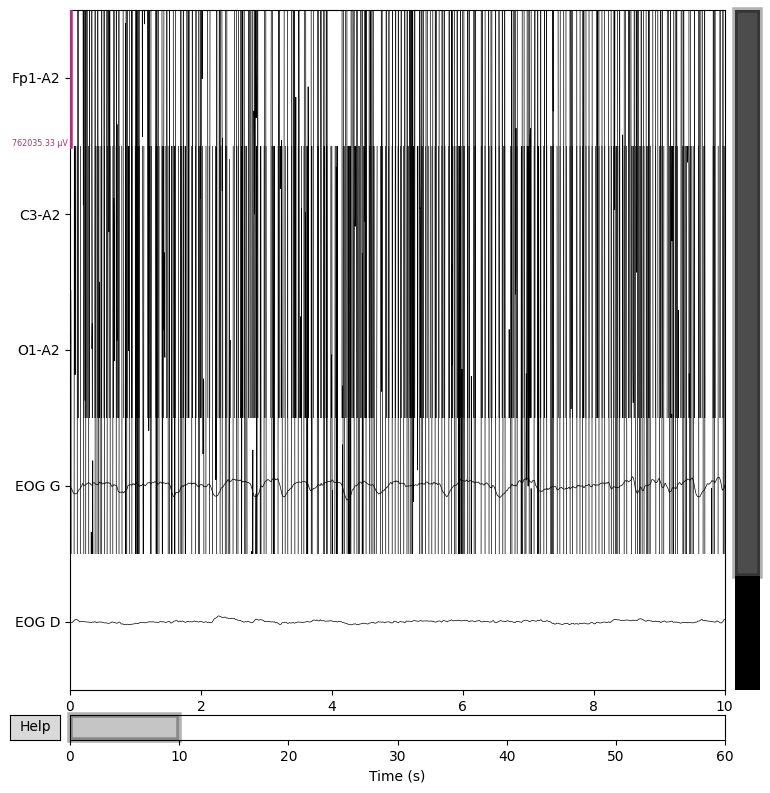

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 4 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 4.00 Hz
- Upper transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 5.00 Hz)
- Filter length: 1691 samples (6.605 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 4 - 8 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 4.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 3.00 Hz)
- Upper passband edge: 8.0

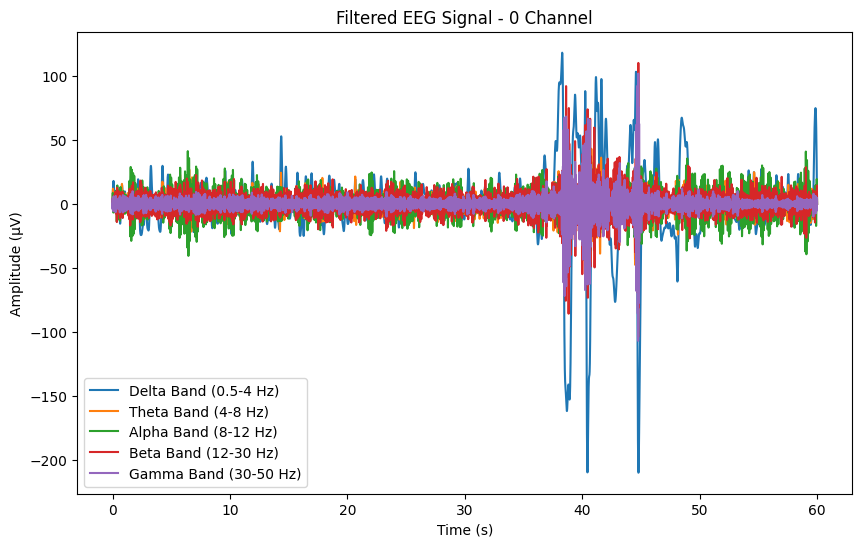

In [3]:
import mne
import numpy as np
import matplotlib.pyplot as plt

# Load the EEG data from an EDF file
def load_eeg_data(edf_file):
    raw = mne.io.read_raw_edf(edf_file, preload=True)
    raw.filter(0.5, 50, fir_design='firwin')  # Apply a bandpass filter (0.5-50 Hz) to remove noise
    return raw

# Band-pass filter function
def filter_eeg_band(raw, l_freq, h_freq):
    filtered_raw = raw.copy().filter(l_freq, h_freq, fir_design='firwin')
    return filtered_raw

# Plot raw EEG signals
def plot_raw_eeg(raw, channels=5, duration=10):
    raw.plot(n_channels=channels, duration=duration, scalings='auto', title='Raw EEG Signals')
    plt.show()

# Plot filtered EEG signals for different bands
def plot_filtered_eeg(raw, bands, channel):
    plt.figure(figsize=(10, 6))
    times = np.arange(raw.n_times) / raw.info['sfreq']  # Time axis
    
    for band, (l_freq, h_freq) in bands.items():
        filtered_raw = filter_eeg_band(raw, l_freq, h_freq)
        eeg_data, times = filtered_raw[channel, :]
        plt.plot(times, eeg_data[0], label=f'{band} Band ({l_freq}-{h_freq} Hz)')
    
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude (µV)")
    plt.title(f"Filtered EEG Signal - {channel} Channel")
    plt.legend()
    plt.show()

# Define EEG frequency bands
bands = {
    "Delta": (0.5, 4),
    "Theta": (4, 8),
    "Alpha": (8, 12),
    "Beta": (12, 30),
    "Gamma": (30, 50)
}

# Load and visualize EEG data
edf_file = "/Users/pavankonam/Downloads/Dataset for EEG/New Database/EEG-waves/01NN_seg01.edf"  # Replace with an actual EDF file
raw_eeg = load_eeg_data(edf_file)
plot_raw_eeg(raw_eeg)
plot_filtered_eeg(raw_eeg, bands, channel=0)  # Change channel index as needed


Extracting EDF parameters from /Users/pavankonam/Downloads/Dataset for EEG/New Database/EEG-waves/01NN_seg01.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 15359  =      0.000 ...    59.996 secs...
NOTE: pick_types() is a legacy function. New code should use inst.pick(...).


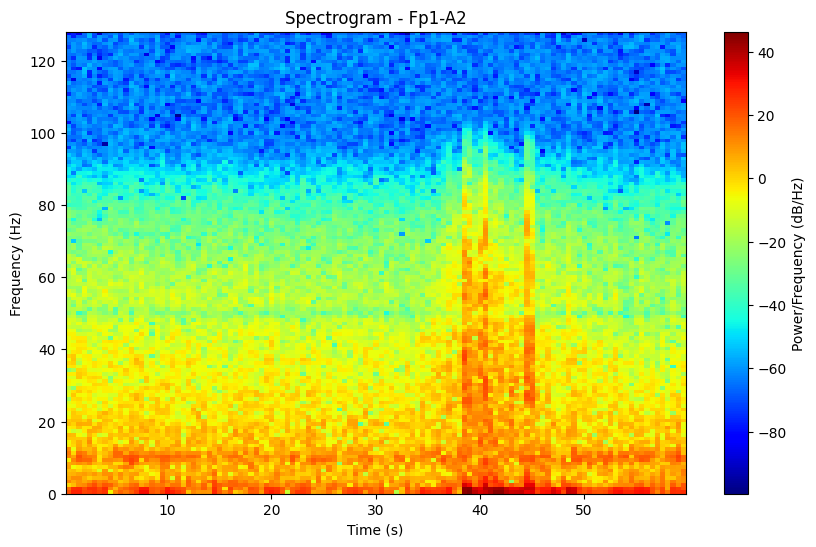

In [5]:
import mne
import numpy as np
import matplotlib.pyplot as plt
import os

# Path to an EDF file (update this to a valid file path from your dataset)
edf_file_path = "/Users/pavankonam/Downloads/Dataset for EEG/New Database/EEG-waves/01NN_seg01.edf"

# Load EDF file
data = mne.io.read_raw_edf(edf_file_path, preload=True)
data.pick_types(eeg=True)  # Select EEG channels

# Get raw EEG signal from the first channel
signal, times = data[0]  # Extract first channel
fs = int(data.info['sfreq'])  # Sampling frequency

# Compute spectrogram
plt.figure(figsize=(10, 6))
plt.specgram(signal[0], NFFT=256, Fs=fs, noverlap=128, cmap='jet')
plt.colorbar(label='Power/Frequency (dB/Hz)')
plt.title(f"Spectrogram - {data.ch_names[0]}")
plt.xlabel("Time (s)")
plt.ylabel("Frequency (Hz)")
plt.show()


In [7]:
import mne
import numpy as np
import matplotlib.pyplot as plt
import os
import pandas as pd

# Paths (Update these accordingly)
edf_folder = "/Users/pavankonam/Downloads/Dataset for EEG/New Database/EEG-waves"  # Folder containing EDF files
output_folder = "/Users/pavankonam/Downloads/Dataset for EEG/New Database/EEG-waves/spectrogram_images"  # Folder to save spectrograms
csv_path = "/Users/pavankonam/Downloads/Dataset for EEG/modified_file.csv"  # CSV containing filename-category mapping

# Load CSV file with category mappings
df = pd.read_csv(csv_path)
filename_to_category = dict(zip(df['Filename'], df['Category']))

# Ensure output folder exists
os.makedirs(output_folder, exist_ok=True)

# Process each EDF file
for edf_file in os.listdir(edf_folder):
    if edf_file.endswith(".edf"):
        edf_path = os.path.join(edf_folder, edf_file)
        category = filename_to_category.get(edf_file, "Unknown")
        category_folder = os.path.join(output_folder, category)
        os.makedirs(category_folder, exist_ok=True)

        try:
            # Load EDF file with error handling for timestamps
            data = mne.io.read_raw_edf(edf_path, preload=True, exclude_after_unique=False)
            data.pick_types(eeg=True)  # Select EEG channels
            
            for i, ch_name in enumerate(data.ch_names):
                signal, times = data[i]  # Extract signal
                fs = int(data.info['sfreq'])

                # Generate spectrogram
                plt.figure(figsize=(10, 6))
                plt.specgram(signal[0], NFFT=256, Fs=fs, noverlap=128, cmap='jet')
                plt.colorbar(label='Power/Frequency (dB/Hz)')
                plt.title(f"{ch_name} - {edf_file}")
                plt.xlabel("Time (s)")
                plt.ylabel("Frequency (Hz)")

                # Save image
                img_filename = f"{edf_file.replace('.edf', '')}_{ch_name}.png"
                img_path = os.path.join(category_folder, img_filename)
                plt.savefig(img_path)
                plt.close()

        except ValueError as e:
            print(f"Skipping {edf_file} due to error: {e}")


Extracting EDF parameters from /Users/pavankonam/Downloads/Dataset for EEG/New Database/EEG-waves/73MT_seg04.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 15359  =      0.000 ...    59.996 secs...
NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Extracting EDF parameters from /Users/pavankonam/Downloads/Dataset for EEG/New Database/EEG-waves/09PP_seg03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 15359  =      0.000 ...    59.996 secs...
NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Extracting EDF parameters from /Users/pavankonam/Downloads/Dataset for EEG/New Database/EEG-waves/06DC_seg01.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 15359  =      0.000 ...    59.996 secs...
NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Extr

/Users/pavankonam/miniconda3/envs/ai-engineering-bootcamp/lib/python3.10/site-packages/matplotlib/axes/_axes.py:8089: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


Extracting EDF parameters from /Users/pavankonam/Downloads/Dataset for EEG/New Database/EEG-waves/60MF_seg01.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 15359  =      0.000 ...    59.996 secs...
NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Extracting EDF parameters from /Users/pavankonam/Downloads/Dataset for EEG/New Database/EEG-waves/03MG_seg02.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 15359  =      0.000 ...    59.996 secs...
NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Extracting EDF parameters from /Users/pavankonam/Downloads/Dataset for EEG/New Database/EEG-waves/subject455_SO4.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 29219  =      0.000 ...    73.047 secs...
NOTE: pick_types() is a legacy function. New code should use inst.pick(...).


/var/folders/60/m4vjsxs154b8jqhld_x5c2j80000gn/T/ipykernel_1534/250416113.py:29: RuntimeWarning: Scaling factor is not defined in following channels:
POx-Red, POx-InfraRed
  data = mne.io.read_raw_edf(edf_path, preload=True, exclude_after_unique=False)
/var/folders/60/m4vjsxs154b8jqhld_x5c2j80000gn/T/ipykernel_1534/250416113.py:29: RuntimeWarning: Physical range is not defined in following channels:
POx-Red, POx-InfraRed
  data = mne.io.read_raw_edf(edf_path, preload=True, exclude_after_unique=False)


Extracting EDF parameters from /Users/pavankonam/Downloads/Dataset for EEG/New Database/EEG-waves/DL030_night07.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 34999  =      0.000 ...   139.996 secs...
NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Extracting EDF parameters from /Users/pavankonam/Downloads/Dataset for EEG/New Database/EEG-waves/subject348_SO7.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 29303  =      0.000 ...    73.258 secs...
NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Extracting EDF parameters from /Users/pavankonam/Downloads/Dataset for EEG/New Database/EEG-waves/subject107_SO8.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 29219  =      0.000 ...    73.047 secs...
NOTE: pick_types() is a legacy function. New code should use inst.pick

In [19]:
import os
import shutil
import random

# Path to the folder containing 5 category subfolders
spectrogram_dir = "/Users/pavankonam/Downloads/Dataset for EEG/New Database/EEG-waves/spectrogram_images"

# Define dataset split ratios
train_ratio = 0.8
val_ratio = 0.1
test_ratio = 0.1

# Ensure train, val, and test directories exist
for split in ["train", "val", "test"]:
    os.makedirs(os.path.join(spectrogram_dir, split), exist_ok=True)

# Iterate over the 5 category subfolders (excluding system files)
for category in os.listdir(spectrogram_dir):
    category_path = os.path.join(spectrogram_dir, category)

    # Ignore files like .DS_Store, process only directories
    if not os.path.isdir(category_path) or category in ["train", "val", "test"]:
        continue  

    # Ensure subfolders exist inside train, val, and test
    for split in ["train", "val", "test"]:
        os.makedirs(os.path.join(spectrogram_dir, split, category), exist_ok=True)

    # Get list of spectrogram images in the category
    image_files = [f for f in os.listdir(category_path) if f.endswith((".png", ".jpg"))]
    random.shuffle(image_files)  # Shuffle for randomness

    # Split the data
    train_split = int(len(image_files) * train_ratio)
    val_split = int(len(image_files) * (train_ratio + val_ratio))

    train_files = image_files[:train_split]
    val_files = image_files[train_split:val_split]
    test_files = image_files[val_split:]

    # Move images to respective folders
    for file, split in zip([train_files, val_files, test_files], ["train", "val", "test"]):
        for img in file:
            src = os.path.join(category_path, img)
            dst = os.path.join(spectrogram_dir, split, category, img)
            shutil.move(src, dst)

    # Optional: Remove empty category folder (original location)
    os.rmdir(category_path)

print("✅ Dataset split completed.")


✅ Dataset split completed.


In [20]:
import os
import glob

# Root dataset directory
data_dir = "/Users/pavankonam/Downloads/Dataset for EEG/New Database/EEG-waves/spectrogram_images"

# Remove all .DS_Store files from train, val, and test directories
for folder in ["train", "val", "test"]:
    path = os.path.join(data_dir, folder)
    ds_store_files = glob.glob(os.path.join(path, "**", ".DS_Store"), recursive=True)
    for ds_file in ds_store_files:
        print(f"Removing {ds_file}")
        os.remove(ds_file)

print("✅ All .DS_Store files removed successfully.")


✅ All .DS_Store files removed successfully.


In [21]:
import torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

# Define data transformations (normalize for CNN stability)
transform = transforms.Compose([
    transforms.Resize((128, 128)),  # Resize all images to a fixed size
    transforms.ToTensor(),  # Convert images to PyTorch tensors
    transforms.Normalize(mean=[0.5], std=[0.5])  # Normalize to [-1,1] range
])

# Path to dataset
data_dir = "/Users/pavankonam/Downloads/Dataset for EEG/New Database/EEG-waves/spectrogram_images"

# Load datasets
train_dataset = datasets.ImageFolder(root=f"{data_dir}/train", transform=transform)
val_dataset = datasets.ImageFolder(root=f"{data_dir}/val", transform=transform)
test_dataset = datasets.ImageFolder(root=f"{data_dir}/test", transform=transform)

# Create DataLoaders
batch_size = 32  # Adjust based on GPU memory
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Check class labels (Ensure correct mapping)
print("Classes:", train_dataset.classes)
print("Train Samples:", len(train_dataset))
print("Validation Samples:", len(val_dataset))
print("Test Samples:", len(test_dataset))


Classes: ['Abstract and Thought based', 'Adventure and Movement', 'Fear and Uncertainity', 'Miscellaneous & Unclear', 'People and Social Interaction']
Train Samples: 18977
Validation Samples: 2372
Test Samples: 2375


Suggested Five Dream Categories:
1️⃣ Adventure & Movement (e.g., "going," "went," "see," "where") – Dreams about traveling, exploring, or movement.
2️⃣ Fear & Uncertainty (e.g., "no," "think," "thought," "didn’t") – Dreams involving fear, confusion, or distress.
3️⃣ People & Social Interaction (e.g., "she," "him," "people") – Dreams with conversations, relationships, or interactions.
4️⃣ Abstract & Thought-based (e.g., "thinking," "know," "say") – Dreams focused on thoughts, realizations, or abstract ideas.
5️⃣ Miscellaneous & Unclear (e.g., "some," "something," "things") – Dreams that don’t fit neatly into one category.


Epoch 1/30 - Time: 406.83s
✅ Train Loss: 1.3511, Train Acc: 44.1324%
✅ Val Loss: 1.3140, Val Acc: 45.6998%

Epoch 2/30 - Time: 405.41s
✅ Train Loss: 1.3257, Train Acc: 45.3444%
✅ Val Loss: 1.3208, Val Acc: 45.0253%

Epoch 3/30 - Time: 406.35s
✅ Train Loss: 1.3150, Train Acc: 45.5393%
✅ Val Loss: 1.3337, Val Acc: 45.7841%

Epoch 4/30 - Time: 407.30s
✅ Train Loss: 1.3081, Train Acc: 45.6236%
✅ Val Loss: 1.3000, Val Acc: 45.6577%

Epoch 5/30 - Time: 408.63s
✅ Train Loss: 1.2954, Train Acc: 45.9872%
✅ Val Loss: 1.2725, Val Acc: 46.9646%

Epoch 6/30 - Time: 405.66s
✅ Train Loss: 1.2757, Train Acc: 46.6459%
✅ Val Loss: 1.2690, Val Acc: 47.3862%

Epoch 7/30 - Time: 409.72s
✅ Train Loss: 1.2585, Train Acc: 47.6577%
✅ Val Loss: 1.2313, Val Acc: 48.9039%

Epoch 8/30 - Time: 411.16s
✅ Train Loss: 1.2314, Train Acc: 48.3006%
✅ Val Loss: 1.2086, Val Acc: 49.8735%

Epoch 9/30 - Time: 420.41s
✅ Train Loss: 1.2032, Train Acc: 48.9276%
✅ Val Loss: 1.1796, Val Acc: 51.6863%

Epoch 10/30 - Time: 420.72s


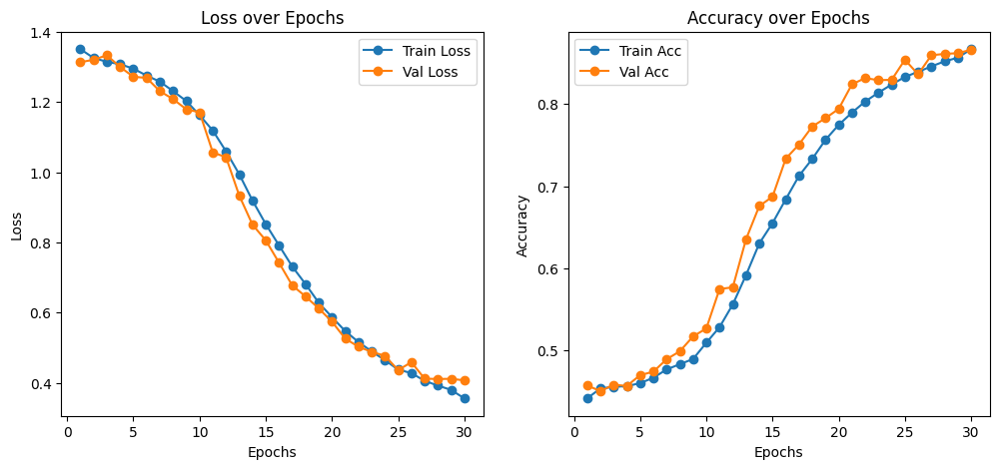

In [33]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import time
import matplotlib.pyplot as plt

# Define CNN Model
class EEG_CNN(nn.Module):
    def __init__(self, num_classes):
        super(EEG_CNN, self).__init__()
        self.conv1 = nn.Conv2d(3, 64, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(128, 256, kernel_size=3, padding=1)
        self.pool = nn.MaxPool2d(2, 2)
        self.fc1 = nn.Linear(256 * 16 * 16, 1024)
        self.fc2 = nn.Linear(1024, 512)
        self.fc3 = nn.Linear(512, num_classes)
        self.dropout = nn.Dropout(0.4)

    def forward(self, x):
        x = self.pool(torch.relu(self.conv1(x)))
        x = self.pool(torch.relu(self.conv2(x)))
        x = self.pool(torch.relu(self.conv3(x)))
        x = x.view(x.size(0), -1)
        x = torch.relu(self.fc1(x))
        x = self.dropout(x)
        x = torch.relu(self.fc2(x))
        x = self.fc3(x)
        return x

# Define data transformations
transform = transforms.Compose([
    transforms.RandomRotation(10),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.Resize((128, 128)),  
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5], std=[0.5])
])

# Load datasets
data_dir = "/Users/pavankonam/Downloads/Dataset for EEG/New Database/EEG-waves/spectrogram_images"
train_dataset = datasets.ImageFolder(root=f"{data_dir}/train", transform=transform)
val_dataset = datasets.ImageFolder(root=f"{data_dir}/val", transform=transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)

# Initialize Model
num_classes = len(train_dataset.classes)
device = "mps"  # Adjust if needed
model = EEG_CNN(num_classes).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0003)  # Lower LR helps stability

# Training function with 30 epochs and plotting
def train(model, train_loader, val_loader, criterion, optimizer, epochs=30, device="mps"):
    train_losses, val_losses = [], []
    train_accs, val_accs = [], []
    
    for epoch in range(epochs):
        start_time = time.time()
        model.train()
        train_loss, correct_train, total_train = 0.0, 0, 0
        
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            
            train_loss += loss.item() * images.size(0)
            _, predicted = outputs.max(1)
            correct_train += predicted.eq(labels).sum().item()
            total_train += labels.size(0)
        
        train_acc = correct_train / total_train
        train_loss /= total_train
        train_losses.append(train_loss)
        train_accs.append(train_acc)
        
        # Validation phase
        model.eval()
        val_loss, correct_val, total_val = 0.0, 0, 0
        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)
                
                val_loss += loss.item() * images.size(0)
                _, predicted = outputs.max(1)
                correct_val += predicted.eq(labels).sum().item()
                total_val += labels.size(0)
        
        val_acc = correct_val / total_val
        val_loss /= total_val
        val_losses.append(val_loss)
        val_accs.append(val_acc)
        
        end_time = time.time()
        
        print(f"Epoch {epoch+1}/{epochs} - Time: {end_time - start_time:.2f}s")
        print(f"✅ Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4%}")
        print(f"✅ Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4%}\n")

    torch.save(model.state_dict(), "best_spectrogram_model.pth")
    
    # Plot accuracy and loss graphs
    plt.figure(figsize=(12, 5))
    
    plt.subplot(1, 2, 1)
    plt.plot(range(1, epochs+1), train_losses, label="Train Loss", marker="o")
    plt.plot(range(1, epochs+1), val_losses, label="Val Loss", marker="o")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.title("Loss over Epochs")
    plt.legend()
    
    plt.subplot(1, 2, 2)
    plt.plot(range(1, epochs+1), train_accs, label="Train Acc", marker="o")
    plt.plot(range(1, epochs+1), val_accs, label="Val Acc", marker="o")
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy")
    plt.title("Accuracy over Epochs")
    plt.legend()
    
    plt.show()

# Train the model
train(model, train_loader, val_loader, criterion, optimizer, epochs=30)


In [34]:
import torch
import torch.nn as nn
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from torchvision import datasets

# Define the same CNN Model (must match the trained model)
class EEG_CNN(nn.Module):
    def __init__(self, num_classes):
        super(EEG_CNN, self).__init__()
        self.conv1 = nn.Conv2d(3, 64, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(128, 256, kernel_size=3, padding=1)
        self.pool = nn.MaxPool2d(2, 2)
        self.fc1 = nn.Linear(256 * 16 * 16, 1024)
        self.fc2 = nn.Linear(1024, 512)
        self.fc3 = nn.Linear(512, num_classes)
        self.dropout = nn.Dropout(0.4)

    def forward(self, x):
        x = self.pool(torch.relu(self.conv1(x)))
        x = self.pool(torch.relu(self.conv2(x)))
        x = self.pool(torch.relu(self.conv3(x)))
        x = x.view(x.size(0), -1)
        x = torch.relu(self.fc1(x))
        x = self.dropout(x)
        x = torch.relu(self.fc2(x))
        x = self.fc3(x)
        return x

# Define data transformations (same as training)
transform = transforms.Compose([
    transforms.Resize((128, 128)),  
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5], std=[0.5])
])

# Load test dataset
data_dir = "/Users/pavankonam/Downloads/Dataset for EEG/New Database/EEG-waves/spectrogram_images"
test_dataset = datasets.ImageFolder(root=f"{data_dir}/test", transform=transform)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# Load the trained model
device = "mps"  # Adjust based on availability
num_classes = len(test_dataset.classes)
model = EEG_CNN(num_classes).to(device)
model.load_state_dict(torch.load("best_spectrogram_model.pth", map_location=device))
model.eval()

# Testing function
def test_model(model, test_loader, device="mps"):
    correct, total = 0, 0
    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = outputs.max(1)
            correct += predicted.eq(labels).sum().item()
            total += labels.size(0)
    
    test_accuracy = correct / total
    print(f"✅ Test Accuracy: {test_accuracy:.4%}")

# Run testing
test_model(model, test_loader, device)


✅ Test Accuracy: 87.7895%
